# Transfer studies

In [1]:
from pathlib import Path

import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
from matplotlib import colors

import matplotlib_inline
matplotlib_inline.backend_inline.set_matplotlib_formats("pdf", "svg")

from pipoli.core import Dimension

In [2]:
DATA = Path() / "output" / "data" / "data-non-similar-'m'-'L'-'g'-(-1, 1)-(-1, 1)-(0, 0)-50-50-1-10.pkl.gz"

In [11]:
all_data = pd.read_pickle(DATA)

In [4]:
BASE = all_data.attrs["base"]
all_data.attrs

{'base': ['m', 'L', 'g'],
 'space': 'log',
 'b': 10,
 'range_1': (-1, 1),
 'range_2': (-1, 1),
 'range_3': (0, 0),
 'num_1': 50,
 'num_2': 50,
 'num_3': 1,
 'nb_eval_episodes': 10,
 'observations_shape': '(nb_episodes, nb_steps, 17)',
 'actions_shape': '(nb_episodes, nb_steps, 6)',
 'rewards_shape': '(nb_episodes, nb_steps)',
 'infos_shape': '(nb_episodes, nb_steps)',
 'policy_info': {'repo_id': 'farama-minari/HalfCheetah-v5-TQC-expert',
  'filename': 'halfcheetah-v5-TQC-expert.zip',
  'commit': '995505a'},
 'env': 'HalfCheetah-v5',
 'comment': 'the env is default, except for xml_file\ncontexts are not similar\nthe policy was scaled (scaled transfer)'}

## Similar transfer study

### Data processing

In [5]:
BASE_DIMENSIONS = [
    M := Dimension([1, 0, 0]),
    L := Dimension([0, 1, 0]),
    T := Dimension([0, 0, 1]),
]
Unit = Dimension([0, 0, 0])

In [12]:
process_df = all_data[["context", "b1", "b2", "b3", "infos"]].sort_values(["b1", "b2", "b3"])

In [7]:
process_df

,context,b1,b2,b3,infos
cheetah-m-L-g_1.400e+00_5.000e-02_9.810e+00,"Context([Dimension([1 0 0]), Dimension([0 1 0]...",1.4,0.050000,9.81,"[[{'x_position': 0.09830678907668539, 'x_veloc..."
cheetah-m-L-g_1.400e+00_5.493e-02_9.810e+00,"Context([Dimension([1 0 0]), Dimension([0 1 0]...",1.4,0.054927,9.81,"[[{'x_position': 0.11484361970649284, 'x_veloc..."
cheetah-m-L-g_1.400e+00_6.034e-02_9.810e+00,"Context([Dimension([1 0 0]), Dimension([0 1 0]...",1.4,0.060340,9.81,"[[{'x_position': 0.05101414567190056, 'x_veloc..."
cheetah-m-L-g_1.400e+00_6.629e-02_9.810e+00,"Context([Dimension([1 0 0]), Dimension([0 1 0]...",1.4,0.066286,9.81,"[[{'x_position': 0.13343972025013, 'x_velocity..."
cheetah-m-L-g_1.400e+00_7.282e-02_9.810e+00,"Context([Dimension([1 0 0]), Dimension([0 1 0]...",1.4,0.072817,9.81,"[[{'x_position': 0.06048380041241388, 'x_veloc..."
...,...,...,...,...,...
cheetah-m-L-g_1.400e+02_3.433e+00_9.810e+00,"Context([Dimension([1 0 0]), Dimension([0 1 0]...",140.0,3.433244,9.81,"[[{'x_position': 0.02633190623824155, 'x_veloc..."
cheetah-m-L-g_1.400e+02_3.772e+00_9.810e+00,"Context([Dimension([1 0 0]), Dimension([0 1 0]...",140.0,3.771560,9.81,"[[{'x_position': 0.050723145116421724, 'x_velo..."
cheetah-m-L-g_1.400e+02_4.143e+00_9.810e+00,"Context([Dimension([1 0 0]), Dimension([0 1 0]...",140.0,4.143214,9.81,"[[{'x_position': -0.025937703622216847, 'x_vel..."
cheetah-m-L-g_1.400e+02_4.551e+00_9.810e+00,"Context([Dimension([1 0 0]), Dimension([0 1 0]...",140.0,4.551491,9.81,"[[{'x_position': 0.0655389698348835, 'x_veloci..."


In [ ]:
def extract_adim_reward_forward(infos, context, base):
    forward_reward_adim, _ = context.make_transforms([L / T], base)
    reward = np.vectorize(lambda infs: forward_reward_adim(infs["reward_forward"])[0])
    return reward(infos)

def extract_adim_reward_ctrl(infos, context, base):
    control_cost_adim, _ = context.make_transforms([M**2*L**4/T**4], base)
    reward = np.vectorize(lambda infs: control_cost_adim(infs["reward_ctrl"])[0])
    return reward(infos)


extract_adim_reward_ctrl(all_data["infos"].iat[0][0, 0], all_data["context"].iat[0], BASE)

array(-7.4877462e-05)

In [ ]:
original_context = process_df["context"].loc["original"]

process_df["adimensional_distance_to_original"] = process_df["context"].map(lambda c: c.adimensional_distance(original_context, BASE))
process_df["cosine_similarity_to_original"] = process_df["context"].map(lambda c: c.cosine_similarity(original_context))
process_df["rewards_forward"] = process_df["infos"].map(np.vectorize(lambda infos: infos["reward_forward"]))
process_df["rewards_ctrl"] = process_df["infos"].map(np.vectorize(lambda infos: infos["reward_ctrl"]))
process_df["totals_reward_forward"] = process_df["rewards_forward"].map(lambda r: r.sum(axis=1))
process_df["totals_reward_ctrl"] = process_df["rewards_ctrl"].map(lambda r: r.sum(axis=1))
process_df["totals_reward"] = process_df.apply(lambda row: row["totals_reward_forward"] + row["totals_reward_ctrl"], axis=1)
process_df["mean_total_reward_forward"] = process_df["totals_reward_forward"].map(np.mean)
process_df["mean_total_reward_ctrl"] = process_df["totals_reward_ctrl"].map(np.mean)
process_df["mean_total_reward"] = process_df["totals_reward"].map(np.mean)
process_df["std_total_reward_forward"] = process_df["totals_reward_forward"].map(np.std)
process_df["std_total_reward_ctrl"] = process_df["totals_reward_ctrl"].map(np.std)
process_df["std_total_reward"] = process_df["totals_reward"].map(np.std)
process_df["mean_total_reward_difference"] = process_df["mean_total_reward"] - process_df["mean_total_reward"].loc["original"]

In [36]:
process_df

,context,b1,b2,b3,infos,adimensional_distance_to_original,cosine_similarity_to_original,rewards_forward,rewards_ctrl,totals_reward_forward,totals_reward_ctrl,totals_reward,mean_total_reward_forward,mean_total_reward_ctrl,mean_total_reward,std_total_reward_forward,std_total_reward_ctrl,std_total_reward,mean_total_reward_difference
cheetah-m-L-g_1.400e+00_5.000e-02_9.810e+00,"Context([Dimension([1 0 0]), Dimension([0 1 0]...",1.4,0.050000,9.81,"[[{'x_position': 0.09830678907668539, 'x_veloc...",601.481551,0.999488,"[[2.096527523791482, 2.384561361184436, 2.1779...","[[-2.941696784682544e-05, -0.00011125325094847...","[125.5314971754822, 90.23813255653087, -53.182...","[-0.011253593486925388, -0.012431440707853523,...","[125.52024358199527, 90.22570111582301, -53.30...",19.494909,-0.069933,19.424976,61.383460,0.049653,61.420891,-8113.566401
cheetah-m-L-g_1.400e+00_5.493e-02_9.810e+00,"Context([Dimension([1 0 0]), Dimension([0 1 0]...",1.4,0.054927,9.81,"[[{'x_position': 0.11484361970649284, 'x_veloc...",544.291334,0.999488,"[[1.18749398757828, 1.2073440679618566, 1.0451...","[[-4.817265359318104e-05, -0.00010613056942726...","[-6.648354642834696, 47.46506616664042, 1.9910...","[-0.009335948135262652, -0.012237836653248908,...","[-6.657690590969959, 47.45282832998717, 1.9820...",57.216358,-0.011390,57.204968,52.943267,0.001973,52.942351,-8075.786408
cheetah-m-L-g_1.400e+00_6.034e-02_9.810e+00,"Context([Dimension([1 0 0]), Dimension([0 1 0]...",1.4,0.060340,9.81,"[[{'x_position': 0.05101414567190056, 'x_veloc...",492.685710,0.999488,"[[1.2763557785340998, 1.4113850928585001, 1.30...","[[-6.150529577748443e-05, -0.00010596319315829...","[21.728762478011017, 22.266872592082127, 108.1...","[-0.012140456717686494, -0.009906702619811386,...","[21.71662202129333, 22.256965889462315, 108.09...",58.932015,-0.034543,58.897472,50.733051,0.046056,50.757117,-8074.093904
cheetah-m-L-g_1.400e+00_6.629e-02_9.810e+00,"Context([Dimension([1 0 0]), Dimension([0 1 0]...",1.4,0.066286,9.81,"[[{'x_position': 0.13343972025013, 'x_velocity...",446.088403,0.999488,"[[1.7638512024134099, 1.895268479692454, 1.687...","[[-0.00012276853055599897, -0.0001216385075438...","[249.84061371544473, 86.77261969073693, 85.841...","[-0.011723297837586393, -0.012189012398140325,...","[249.82889041760714, 86.76043067833879, 85.829...",33.883820,-0.038600,33.845220,89.729839,0.042982,89.754514,-8099.146157
cheetah-m-L-g_1.400e+00_7.282e-02_9.810e+00,"Context([Dimension([1 0 0]), Dimension([0 1 0]...",1.4,0.072817,9.81,"[[{'x_position': 0.06048380041241388, 'x_veloc...",403.987154,0.999488,"[[1.2042985322809703, 1.301315288910092, 1.132...","[[-6.461003081720937e-05, -0.00012135989251246...","[4.594150097283941, 19.370825079663724, -6.774...","[-0.07643258995010604, -0.09345541498330294, -...","[4.517717507333835, 19.27736966468042, -6.7864...",55.923331,-0.032912,55.890419,52.510133,0.032558,52.522669,-8077.100957
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
cheetah-m-L-g_1.400e+02_3.433e+00_9.810e+00,"Context([Dimension([1 0 0]), Dimension([0 1 0]...",140.0,3.433244,9.81,"[[{'x_position': 0.02633190623824155, 'x_veloc...",5.709710,0.953489,"[[-0.03029420031102938, -0.02329627910428121, ...","[[-4.7816261076257595e-05, -8.686689197077376e...","[-1.3694443056531338, 1.0830634911849835, 3.80...","[-0.09272100692635649, -0.0980367467877267, -0...","[-1.4621653125794902, 0.9850267443972568, 3.70...",0.771426,-0.094646,0.676780,1.388479,0.003914,1.387337,-8132.314597
cheetah-m-L-g_1.400e+02_3.772e+00_9.810e+00,"Context([Dimension([1 0 0]), Dimension([0 1 0]...",140.0,3.771560,9.81,"[[{'x_position': 0.050723145116421724, 'x_velo...",5.718038,0.953483,"[[0.0054503423914187155, 0.012104985400488962,...","[[-6.236480657968309e-05, -6.395150259596479e-...","[-2.3906929945727025, -1.7387060980028983, -0....","[-0.09849340533154538, -0.09870184800580437, -...","[-2.4891863999042476, -1.8374079460087027, -0....",-0.083478,-0.097647,-0.181125,2.646385

In [37]:
score_df = process_df[["b1", "b2", "b3", "adimensional_distance_to_original", "cosine_similarity_to_original", "mean_total_reward", "std_total_reward", "mean_total_reward_forward", "std_total_reward_forward", "mean_total_reward_ctrl", "std_total_reward_ctrl"]].rename(columns=dict(zip(["b1", "b2", "b3"], BASE)))

### Visualization

In [38]:
def heatmap(df, x, y, C, /, title=None, xlabel=None, ylabel=None, zlabel=None, xscale="log", yscale="log", **kwargs):
    xs = np.array(df[x])
    ys = np.array(df[y])
    Cs = np.array(df[C])

    Nx = np.sqrt(xs.size).astype(int)
    Ny = np.sqrt(ys.size).astype(int)
    X = xs.reshape((Nx, Ny))
    Y = ys.reshape((Nx, Ny))
    Z = Cs.reshape((Nx, Ny))

    plt.figure()
    plt.pcolormesh(X, Y, Z, **kwargs)
    plt.xscale(xscale)
    plt.yscale(yscale)
    plt.title(title or "")
    plt.xlabel(xlabel or x)
    plt.ylabel(ylabel or y)
    plt.colorbar(label=zlabel or C)

In [39]:
score_df

,m,L,g,adimensional_distance_to_original,cosine_similarity_to_original,mean_total_reward,std_total_reward,mean_total_reward_forward,std_total_reward_forward,mean_total_reward_ctrl,std_total_reward_ctrl
cheetah-m-L-g_1.400e+00_5.000e-02_9.810e+00,1.4,0.050000,9.81,601.481551,0.999488,19.424976,61.420891,19.494909,61.383460,-0.069933,0.049653
cheetah-m-L-g_1.400e+00_5.493e-02_9.810e+00,1.4,0.054927,9.81,544.291334,0.999488,57.204968,52.942351,57.216358,52.943267,-0.011390,0.001973
cheetah-m-L-g_1.400e+00_6.034e-02_9.810e+00,1.4,0.060340,9.81,492.685710,0.999488,58.897472,50.757117,58.932015,50.733051,-0.034543,0.046056
cheetah-m-L-g_1.400e+00_6.629e-02_9.810e+00,1.4,0.066286,9.81,446.088403,0.999488,33.845220,89.754514,33.883820,89.729839,-0.038600,0.042982
cheetah-m-L-g_1.400e+00_7.282e-02_9.810e+00,1.4,0.072817,9.81,403.987154,0.999488,55.890419,52.522669,55.923331,52.510133,-0.032912,0.032558
...,...,...,...,...,...,...,...,...,...,...,...
cheetah-m-L-g_1.400e+02_3.433e+00_9.810e+00,140.0,3.433244,9.81,5.709710,0.953489,0.676780,1.387337,0.771426,1.388479,-0.094646,0.003914
cheetah-m-L-g_1.400e+02_3.772e+00_9.810e+00,140.0,3.771560,9.81,5.718038,0.953483,-0.181125,2.646372,-0.083478,2.646385,-0.097647,0.001747
cheetah-m-L-g_1.400e+02_4.143e+00_9.810e+00,140.0,4.143214,9.81,5.725627,0.953476,-1.076724,2.077169,-0.979005,2.077099,-0.097719,0.001464
cheetah-m-L-g_1.400e+02_4.551e+00_9.810e+00,140.0,4.551491,9.81,5.732541,0.953468,-1.033666,1.807619,-0.934717,1.807635,-0.098949,0.000738


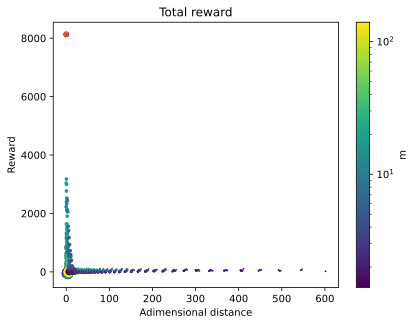

In [40]:
viz_df = score_df.sort_values(["adimensional_distance_to_original"])

viz_df.plot.scatter(
    x="adimensional_distance_to_original",
    y="mean_total_reward",
    s=viz_df["L"]*15,
    c="m",
    xlabel="Adimensional distance",
    ylabel="Reward",
    title="Total reward",
    legend=False,
    # cmap="coolwarm",
    norm="log", #colors.CenteredNorm(vcenter=original_context.value("m"))
    # logx=True,
)
plt.scatter(0, score_df.loc["original"]["mean_total_reward"], marker="o", s=25, facecolor="none", edgecolors="r")

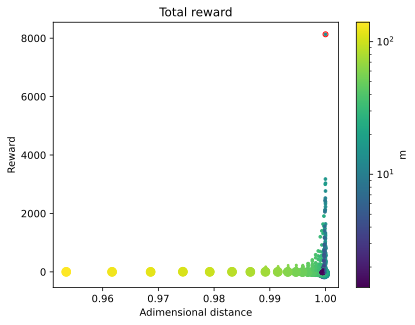

In [41]:
viz_df = score_df.sort_values(["adimensional_distance_to_original"])

viz_df.plot.scatter(
    x="cosine_similarity_to_original",
    y="mean_total_reward",
    s=viz_df["L"]*15,
    c="m",
    xlabel="Adimensional distance",
    ylabel="Reward",
    title="Total reward",
    legend=False,
    # cmap="coolwarm",
    norm="log", #colors.CenteredNorm(vcenter=original_context.value("m"))
    # logx=True,
)
plt.scatter(1, score_df.loc["original"]["mean_total_reward"], marker="o", s=25, facecolor="none", edgecolors="r")

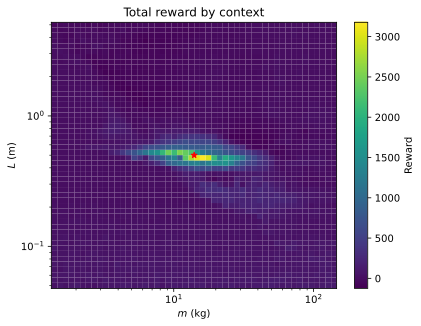

In [42]:
heatmap(
    score_df.drop("original").sort_values(["m", "L"]),
    "m",
    "L",
    "mean_total_reward",
    title="Total reward by context",
    xlabel="$m$ (kg)",
    ylabel="$L$ (m)",
    zlabel="Reward",
    # norm=colors.TwoSlopeNorm(0), #"linear",
    # cmap="coolwarm",
    # xscale="linear",
    # yscale="linear",
)
plt.scatter(original_context.value("m"), original_context.value("L"), c="r", marker="*")

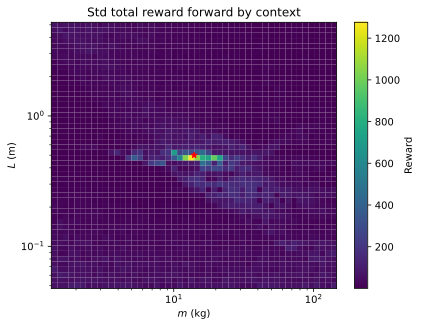

In [43]:
heatmap(
    score_df.drop("original").sort_values(["m", "L"]),
    "m",
    "L",
    "std_total_reward",
    title="Std total reward forward by context",
    xlabel="$m$ (kg)",
    ylabel="$L$ (m)",
    zlabel="Reward",
    # norm=colors.TwoSlopeNorm(0), #"linear",
    # cmap="coolwarm",
    # xscale="linear",
    # yscale="linear",
)
plt.scatter(original_context.value("m"), original_context.value("L"), c="r", marker="*")

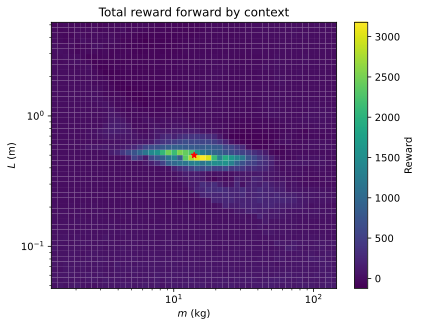

: 

In [ ]:
heatmap(
    score_df.drop("original").sort_values(["m", "L"]),
    "m",
    "L",
    "mean_total_reward_forward",
    title="Total reward forward by context",
    xlabel="$m$ (kg)",
    ylabel="$L$ (m)",
    zlabel="Reward",
    norm="linear",
    # cmap="coolwarm",
    # xscale="linear",
    # yscale="linear",
)
plt.scatter(original_context.value("m"), original_context.value("L"), c="r", marker="*")

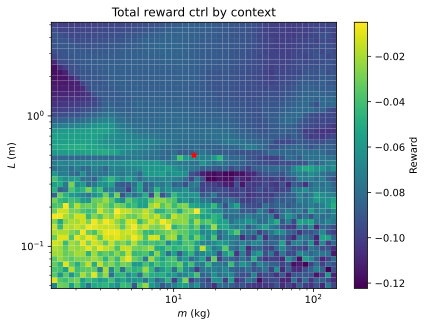

In [45]:
heatmap(
    score_df.drop("original").sort_values(["m", "L"]),
    "m",
    "L",
    "mean_total_reward_ctrl",
    title="Total reward ctrl by context",
    xlabel="$m$ (kg)",
    ylabel="$L$ (m)",
    zlabel="Reward",
    norm="linear",
    # cmap="coolwarm",
    # xscale="linear",
    # yscale="linear",
)
plt.scatter(original_context.value("m"), original_context.value("L"), c="r", marker="*")

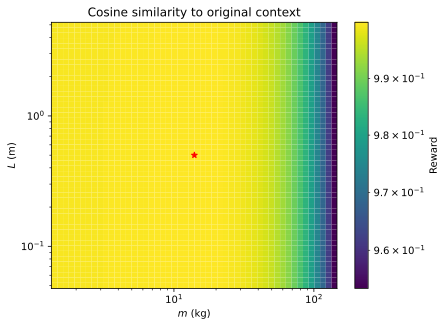

In [46]:
heatmap(
    score_df.drop("original").sort_values(["m", "L"]),
    "m",
    "L",
    "cosine_similarity_to_original",
    title="Cosine similarity to original context",
    xlabel="$m$ (kg)",
    ylabel="$L$ (m)",
    zlabel="Reward",
    norm="log",
    # cmap="coolwarm",
    # xscale="linear",
    # yscale="linear",
)
plt.scatter(original_context.value("m"), original_context.value("L"), c="r", marker="*")

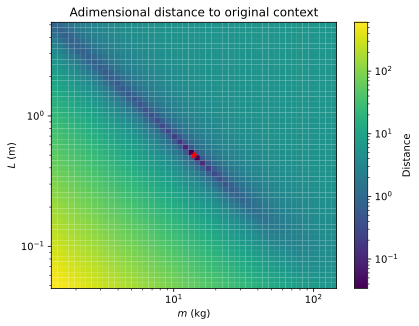

In [47]:
heatmap(
    score_df.drop("original").sort_values(["m", "L"]),
    "m",
    "L",
    "adimensional_distance_to_original",
    title="Adimensional distance to original context",
    xlabel="$m$ (kg)",
    ylabel="$L$ (m)",
    zlabel="Distance",
    norm="log",
    # cmap="coolwarm",
    # xscale="linear",
    # yscale="linear",
)
plt.scatter(original_context.value("m"), original_context.value("L"), c="r", marker="*")